Seasonal hysteresis index after Zuecco et al. (2016), Hydrol. Process. 30, 1449-1466,
adapted for closed monthly-climatology loops rather than open runoff-event loops.

Differences from the published formulation:
  - the annual cycle is re-anchored so the rising limb starts at min(x);
  - the loop is explicitly closed (a climatology returns to its initial state),
    so integration runs over the full normalised range [0, 1].

In [11]:
from matplotlib.ticker import ScalarFormatter

In [1]:
from pathlib import Path
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt

def read_series(path, date_col=0, usecols=None, drop_first_col=False, sort=False):
    df = pd.read_csv(path, parse_dates=[date_col], index_col=date_col, usecols=usecols)
    if drop_first_col:
        df = df.drop(columns=df.columns[0])
    s = df.squeeze()
    return s.sort_index() if sort else s


DATA = Path("/home/py/groundwater/data")
BOW_VALLEY = DATA / "bow_valley"
STREAM = BOW_VALLEY / "stream"

GOWN = pd.read_csv(DATA / "gown" / "combined_absval_20052024_filled.csv", parse_dates=[0], index_col=0)

marmot_creek_wells = ['0931', '0301', '0303', '0386', '0305']
canmore_wells = ['0764', '0760', '0759', '0364']

krns = read_series(STREAM / "krns_daily.csv")
bl   = read_series(STREAM / "05BF025_BarrierLk_TAU_Day_Mean.csv")
lkl  = read_series(STREAM / "05BF009.csv")
jcnc = read_series(STREAM / "05BH013.csv", sort=True)
brac_e = read_series(STREAM / "cr.csv", usecols=[0, 2])
brab   = read_series(STREAM / "brab_elevation.csv", usecols=[0, 2])
brac = read_series(STREAM / "cr_flow.csv", date_col=1, drop_first_col=True)

In [2]:
_trapz = np.trapezoid if hasattr(np, "trapezoid") else np.trapz

_CLASSES = ["I", "II", "III", "IV", "V", "VI", "VII", "VIII"]

In [3]:
def _limb(u, v):
    """Make one limb usable by np.interp: ascending u, duplicates averaged.

    Returns (u, v, monotonic). `monotonic` is False when the limb doubles back
    on itself in u, i.e. v is genuinely multi-valued there and the definite
    integral is only an approximation.
    """
    d = np.diff(u)
    monotonic = bool(np.all(d > 0) or np.all(d < 0))
    idx = np.argsort(u, kind="stable")
    us, vs = u[idx], v[idx]
    uu, inv = np.unique(us, return_inverse=True)
    vv = np.bincount(inv, weights=vs) / np.bincount(inv)
    return uu, vv, monotonic

In [4]:
def _classify(dA_min, dA_max, h, rises_on_rising_limb):
    """Map (dA_min, dA_max, h) onto Zuecco Table I classes I-VIII."""
    if dA_min > 0 and dA_max > 0:
        k = 1                       # pure clockwise
    elif dA_min < 0 and dA_max < 0:
        k = 4                       # pure anticlockwise
    elif h >= 0:
        k = 2                       # figure-eight, dominantly clockwise
    else:
        k = 3                       # figure-eight, dominantly anticlockwise
    return _CLASSES[(0 if rises_on_rising_limb else 4) + k - 1]

In [5]:
def hysteresis_index(x, y, du=0.05, u_start=0.0, n_sub=51):
    """Hysteresis index h for one closed loop of 12 monthly means.

    Parameters
    ----------
    x, y : array_like, length 12, calendar order Jan..Dec
        Independent (streamflow) and dependent (groundwater level) monthly means.
        Must be finite — drop or gap-fill months first.
    du : float
        Width of the integration intervals in normalised-x units.
    u_start : float
        Lower integration limit. 0.0 for a closed climatological loop; raise it
        to exclude the low-flow end if those months are poorly constrained.
    n_sub : int
        Sub-samples per interval used to integrate the piecewise-linear
        interpolant. Only affects quadrature error, not the result's meaning.

    Returns
    -------
    dict with keys:
        h          signed index; >0 clockwise, <0 anticlockwise, ~0 no or
                   symmetric hysteresis. Magnitude = extent of the loop.
        dA_min,
        dA_max     extremes of the per-interval differences; together with h
                   they separate pure loops from figure-eights.
        dA         the full per-interval difference series (length len(edges)-1).
        hyst_class Zuecco Table I class, 'I'..'VIII'.
        anchor_month  1-12, calendar month where the rising limb starts.
        peak_month    1-12, calendar month of max(x).
        monotonic_rising, monotonic_falling
                   False where a limb doubles back in x; treat h as approximate.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    if x.shape != y.shape or x.ndim != 1:
        raise ValueError("x and y must be 1-D arrays of equal length.")
    if not (np.all(np.isfinite(x)) and np.all(np.isfinite(y))):
        raise ValueError("x and y must be finite; drop or fill invalid months first.")

    n = x.size

    # 1. re-anchor the cycle at min(x), then close the loop
    i0 = int(np.argmin(x))
    order = np.roll(np.arange(n), -i0)
    xs = np.append(x[order], x[order][0])
    ys = np.append(y[order], y[order][0])

    # 2. min-max normalise both variables to [0, 1]
    u = (xs - xs.min()) / (xs.max() - xs.min())
    v = (ys - ys.min()) / (ys.max() - ys.min())

    # 3. split at the peak of the independent variable
    ip = int(np.argmax(u))
    ur, vr, mono_r = _limb(u[: ip + 1], v[: ip + 1])
    uf, vf, mono_f = _limb(u[ip:], v[ip:])

    # 4. definite integrals on fixed intervals of u, and their difference
    edges = np.arange(u_start, 1.0 + 1e-9, du)
    if edges.size < 2:
        raise ValueError("du too large for the requested integration range.")
    dA = np.empty(edges.size - 1)
    for k in range(dA.size):
        g = np.linspace(edges[k], edges[k + 1], n_sub)
        dA[k] = _trapz(np.interp(g, ur, vr), g) - _trapz(np.interp(g, uf, vf), g)

    h = float(dA.sum())
    dA_min, dA_max = float(dA.min()), float(dA.max())
    rises = bool(v[ip] >= v[0])

    return {
        "h": h,
        "dA_min": dA_min,
        "dA_max": dA_max,
        "dA": dA,
        "hyst_class": _classify(dA_min, dA_max, h, rises),
        "anchor_month": int(order[0]) + 1,
        "peak_month": int(order[ip % n]) + 1,
        "monotonic_rising": mono_r,
        "monotonic_falling": mono_f,
    }

In [6]:
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
markers = ['o', 's', '^', 'v', 'D', 'p', 'h', '*', 'X', 'P', '<', '>']

# Paul Tol's muted 12-colour palette — print-safe, colorblind-friendly
colors = [
    '#332288', '#117733', '#44AA99', '#88CCEE', '#DDCC77', '#CC6677',
    '#AA4499', '#882255', '#6699CC', '#999933', '#661100', '#888888'
]

In [7]:
def monthly_stats(series, fill_mean=np.nan):
    """Return (mean, 95% CI half-width) arrays of length 12 (one per month).
    Averages within each (year, month) first, then across years.
    Months with no data get fill_mean as the mean and 0 as the CI, and False in valid"""
    df = series.to_frame('val')
    df['month'] = series.index.month
    df['year']  = series.index.year
    per_year_month = df.groupby(['year', 'month'])['val'].mean()
    agg = per_year_month.groupby('month').agg(['mean', 'std', 'count'])
    agg = agg.reindex(range(1, 13))          # ensure all 12 months present

    valid = agg['count'].fillna(0).values > 0 # true where data exists

    agg['mean'] = agg['mean'].fillna(fill_mean)
    ci = (1.96 * agg['std'] / np.sqrt(agg['count'])).fillna(0)
    return agg['mean'].values, ci.values, valid

In [8]:
"""
Companion panel for the monthly hysteresis loop: the average annual cycle of
both variables, phase-aligned with the hysteresis index.

Designed to take the output of `monthly_stats` directly and draw onto an axes
supplied by the caller, so it can be composed beside an existing loop plot.
"""

MONTH_ABBR = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
              "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]


def plot_seasonal_cycle(ax, flow_mean, flow_ci, gw_mean, gw_ci, valid,
                        anchor_month=None, close_cycle=True, normalize=False,
                        flow_label="Flow (m³/s)",
                        gw_label="Groundwater level (mamsl)",
                        flow_color="#2c7fb8", gw_color="#b8562c",
                        annotate_lag=True):
    """Draw the climatological annual cycle of both variables on `ax`.

    Parameters
    ----------
    flow_mean, flow_ci, gw_mean, gw_ci, valid : arrays of length 12
        Straight from `monthly_stats`, calendar order Jan..Dec.
    anchor_month : int or None
        1-12. Month placed at the left edge. Pass the `anchor_month` returned
        by `hysteresis_index` so the panel and the loop share a phase origin.
        None re-derives it as the month of minimum flow.
    close_cycle : bool
        Repeat the anchor month at the right edge, matching the closed loop.
    normalize : bool
        Min-max scale both series to [0, 1] and share one axis. This plots
        exactly the u(t) and v(t) the index integrates, at the cost of units.
        False uses twinned axes and keeps physical units.
    annotate_lag : bool
        Mark both peak months and label the offset between them.

    Returns
    -------
    The axes carrying the groundwater series (`ax` itself when normalize=True,
    otherwise the twin), so the caller can adjust limits afterwards.
    """
    flow = np.where(valid, flow_mean, np.nan)
    gw = np.where(valid, gw_mean, np.nan)
    fci = np.where(valid, flow_ci, np.nan)
    gci = np.where(valid, gw_ci, np.nan)

    if anchor_month is None:
        anchor_month = int(np.nanargmin(flow)) + 1

    order = np.roll(np.arange(12), -(anchor_month - 1))
    if close_cycle:
        order = np.append(order, order[0])

    f, fe = flow[order], fci[order]
    g, ge = gw[order], gci[order]

    if normalize:
        def _scale(a, e):
            lo, hi = np.nanmin(a), np.nanmax(a)
            rng = hi - lo
            return (a - lo) / rng, e / rng
        f, fe = _scale(f, fe)
        g, ge = _scale(g, ge)
        gax = ax
    else:
        gax = ax.twinx()

    x = np.arange(order.size)

    # rising limb of the independent variable: the span the index integrates
    ipk = int(np.nanargmax(f))
    ax.axvspan(x[0], x[ipk], color="#000000", alpha=0.045, lw=0, zorder=0)

    ax.fill_between(x, f - fe, f + fe, color=flow_color, alpha=0.18, lw=0, zorder=2)
    ax.plot(x, f, color=flow_color, lw=2, marker="o", ms=4, zorder=3,
            label=flow_label)

    gax.fill_between(x, g - ge, g + ge, color=gw_color, alpha=0.18, lw=0, zorder=2)
    gax.plot(x, g, color=gw_color, lw=2, marker="s", ms=4, zorder=3,
             label=gw_label)

    if annotate_lag:
        ipg = int(np.nanargmax(g))
        ax.axvline(x[ipk], color=flow_color, ls=":", lw=1.2, zorder=1)
        ax.axvline(x[ipg], color=gw_color, ls=":", lw=1.2, zorder=1)
        lag = ipg - ipk
        if lag == 0:
            txt = "peaks coincide"
        else:
            word = "lags" if lag > 0 else "leads"
            txt = f"GW {word} flow by {abs(lag)} mo"
        ax.text(0.03, 0.97, txt, transform=ax.transAxes, va="top",
                fontsize=8.5, color="#333333")

    ax.set_xticks(x)
    ax.set_xticklabels([MONTH_ABBR[m] for m in order], rotation=45, ha="right")
    ax.set_xlim(x[0], x[-1])
    ax.tick_params(axis="both", which="major", labelsize=10)
    ax.grid(True, linestyle="--", alpha=0.4, color="#cccccc")
    ax.set_axisbelow(True)

    if normalize:
        ax.set_ylabel("Normalised (-)", fontsize=12)
    else:
        ax.set_ylabel(flow_label, fontsize=12, color=flow_color)
        gax.set_ylabel(gw_label, fontsize=12, color=gw_color)
        ax.tick_params(axis="y", labelcolor=flow_color)
        gax.tick_params(axis="y", labelcolor=gw_color)

    handles = ax.get_legend_handles_labels()[0] + gax.get_legend_handles_labels()[0]
    labels = ax.get_legend_handles_labels()[1] + gax.get_legend_handles_labels()[1]
    ax.legend(handles, labels, fontsize=8.5, loc="lower right", framealpha=0.85)

    return gax

In [9]:
def to_calendar_month(pos, valid_months):
    """Translate a 1-based position returned by `hysteresis_index` into a
    calendar month (1-12).
 
    `hysteresis_index` argmins over whatever array it is given. When that array
    is a masked subset, its 'anchor_month'/'peak_month' are positions in the
    subset, not calendar months.
    """
    return int(valid_months[pos - 1]) + 1
 
 
def plot_avg_monthly_hysteresis(well, river_series, title, ax=None,
                                start='2006', end='2023',
                                xlab='Flow (m³/s)',
                                ylab='Groundwater Level (mamsl)'):
    """Draw the mean monthly hysteresis loop. Returns (res, valid_months)."""
    created = ax is None
    if created:
        fig, ax = plt.subplots(figsize=(7, 7), dpi=100)
 
    flow_mean, flow_ci, flow_valid = monthly_stats(river_series.loc[start:end])
    gw_mean,   gw_ci,   gw_valid   = monthly_stats(well.loc[start:end])
 
    valid = flow_valid & gw_valid
    valid_months = np.where(valid)[0]
    if valid_months.size == 0:
        raise ValueError("No months with overlapping data in this date range.")
 
    res = hysteresis_index(flow_mean[valid_months], gw_mean[valid_months])
 
    # grey connecting line, closed back to the first available month
    flow_loop = np.append(flow_mean[valid_months], flow_mean[valid_months[0]])
    gw_loop   = np.append(gw_mean[valid_months],   gw_mean[valid_months[0]])
    ax.plot(flow_loop, gw_loop, linestyle='-', color='#aaaaaa',
            alpha=0.4, linewidth=1)
 
    # 95% CI bars first so markers sit on top
    for m in valid_months:
        ax.errorbar(flow_mean[m], gw_mean[m],
                    xerr=flow_ci[m], yerr=gw_ci[m],
                    fmt='none', ecolor=colors[m], elinewidth=1.2,
                    capsize=3, capthick=1.0, alpha=0.75, zorder=3)
 
    for m in valid_months:
        ax.scatter(flow_mean[m], gw_mean[m],
                   marker=markers[m], color=colors[m], s=90, zorder=5,
                   edgecolors='white', linewidth=0.5, label=month_names[m])
 
    # directional arrows following the calendar, wrapping at the end
    for i, m in enumerate(valid_months):
        nxt = valid_months[(i + 1) % valid_months.size]
        ax.annotate('',
                    xy=(flow_mean[nxt], gw_mean[nxt]),
                    xytext=(flow_mean[m], gw_mean[m]),
                    arrowprops=dict(arrowstyle='-|>', color='#444444', lw=0.9,
                                    alpha=0.6, shrinkA=7, shrinkB=7))
 
    for axis in (ax.xaxis, ax.yaxis):
        fmt = ScalarFormatter(useOffset=False)
        fmt.set_scientific(False)
        axis.set_major_formatter(fmt)
 
    ax.set_xlabel(xlab, fontsize=12)
    ax.set_ylabel(ylab, fontsize=12)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_title(f"{title}\nh = {res['h']:+.3f}  (class {res['hyst_class']})",
                 fontsize=13, fontweight='bold')
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.grid(True, linestyle='--', alpha=0.4, color='#cccccc')
    ax.set_axisbelow(True)
    ax.legend(fontsize=8.5, loc='best', ncol=3, title='Month (Jan→Dec)',
              title_fontsize=8.5, handletextpad=0.4, borderpad=0.6,
              framealpha=0.85)
 
    if created:
        fig.tight_layout()
 
    return res, valid_months
 
 
def plot_well_summary(well, river_series, title,
                      start='2006', end='2023',
                      xlab='Flow (m³/s)',
                      ylab='Groundwater Level (mamsl)',
                      normalize=False):
    """Seasonal cycle (left) beside the hysteresis loop (right)."""
    fig, (axL, axR) = plt.subplots(1, 2, figsize=(11, 5), dpi=300)
 
    res, valid_months = plot_avg_monthly_hysteresis(
        well, river_series, title, ax=axR,
        start=start, end=end, xlab=xlab, ylab=ylab)
 
    flow_mean, flow_ci, flow_valid = monthly_stats(river_series.loc[start:end])
    gw_mean,   gw_ci,   gw_valid   = monthly_stats(well.loc[start:end])
    valid = flow_valid & gw_valid
 
    plot_seasonal_cycle(
        axL, flow_mean, flow_ci, gw_mean, gw_ci, valid,
        anchor_month=to_calendar_month(res['anchor_month'], valid_months),
        normalize=normalize, flow_label=xlab, gw_label=ylab)
    axL.set_title('Mean annual cycle', fontsize=13, fontweight='bold')
 
    fig.tight_layout()
    return fig, res


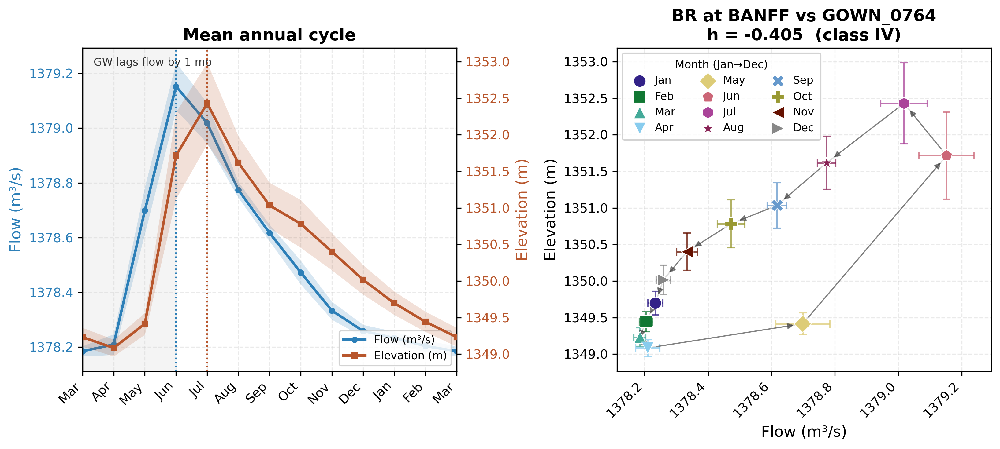

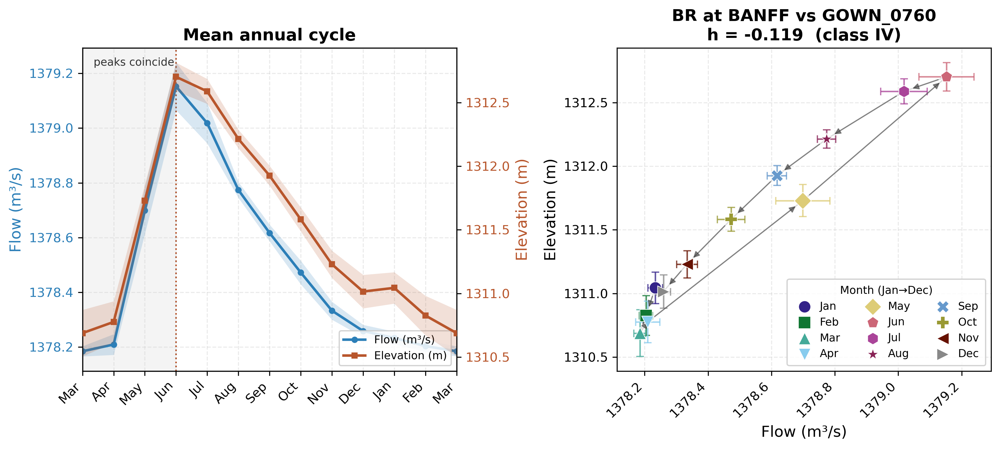

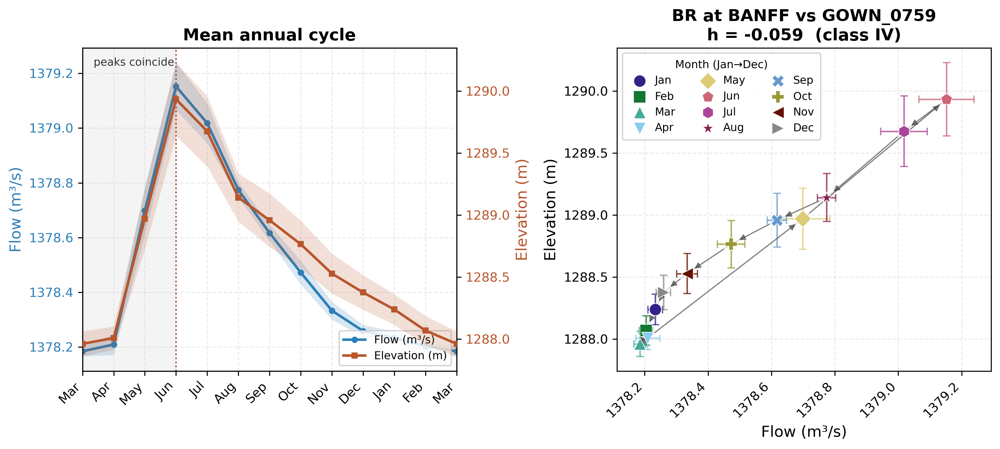

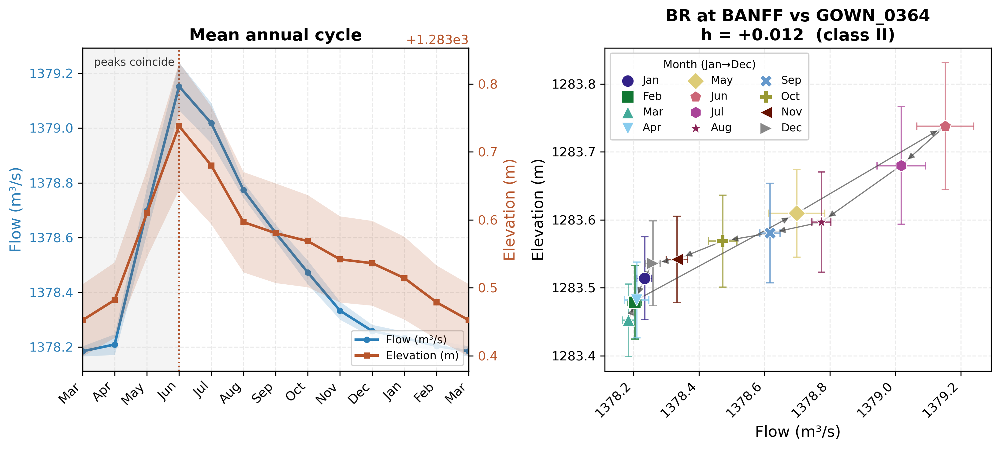

In [13]:
for well in canmore_wells:
    plot_well_summary(GOWN[well], brab, f'BR at BANFF vs GOWN_{well}', start='2005', end='2024', ylab='Elevation (m)')

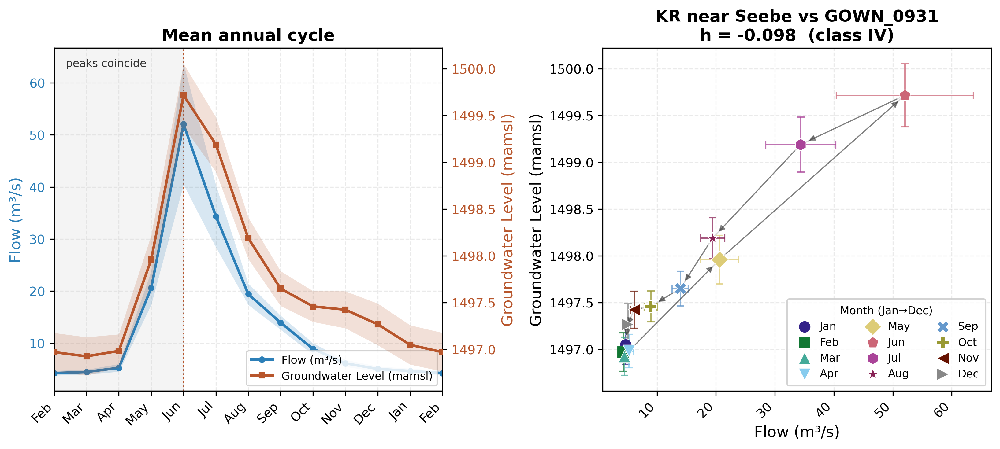

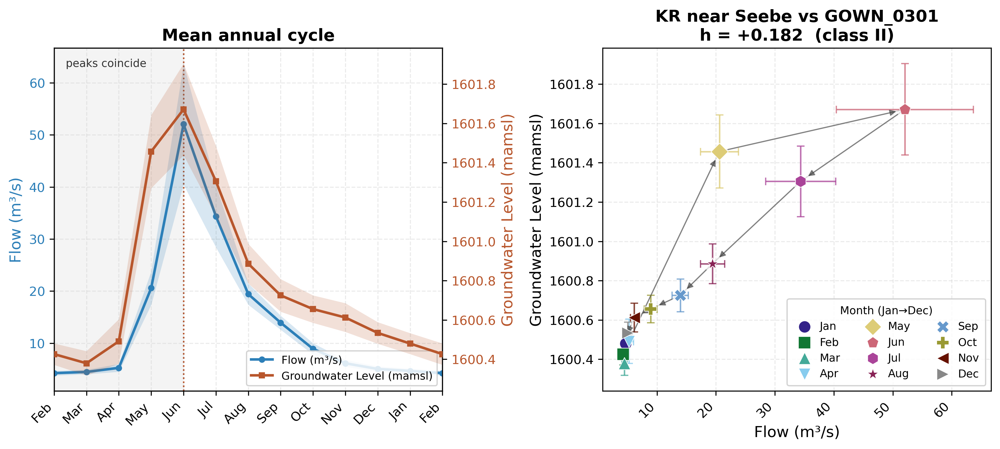

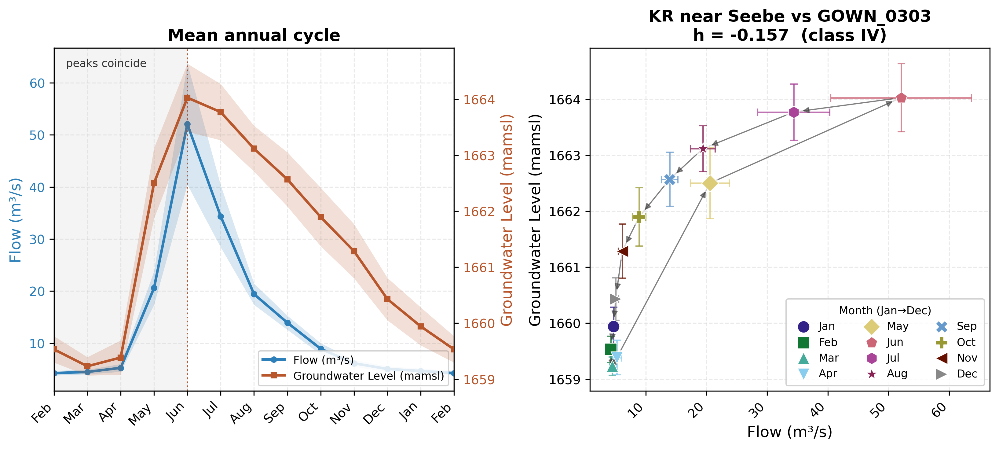

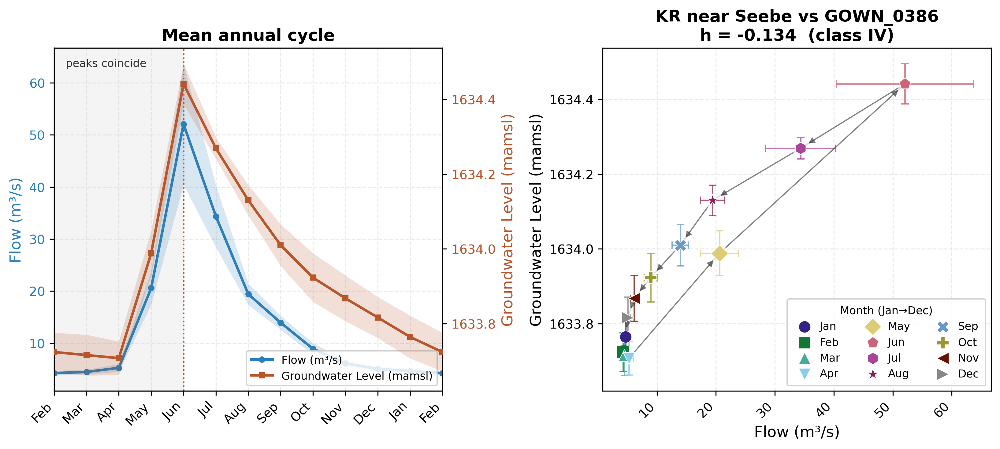

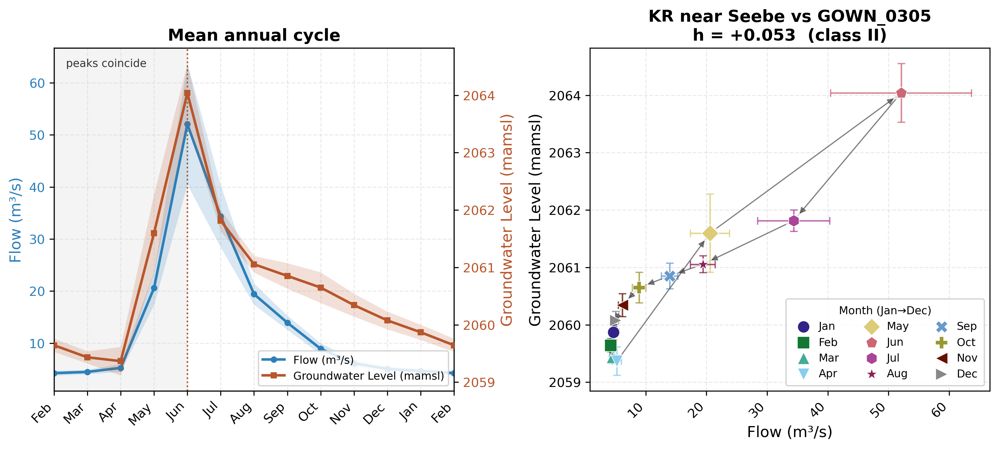

In [14]:
for well in marmot_creek_wells:
    plot_well_summary(GOWN[well], krns, f'KR near Seebe vs GOWN_{well}')

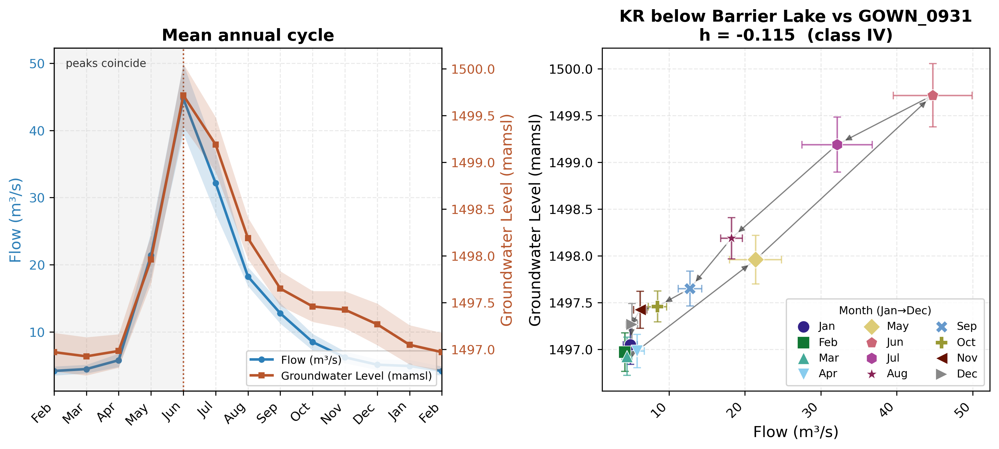

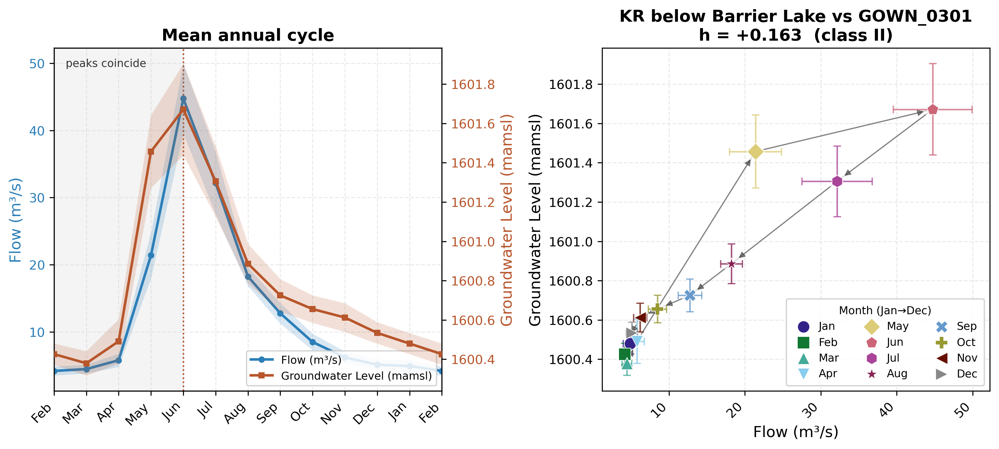

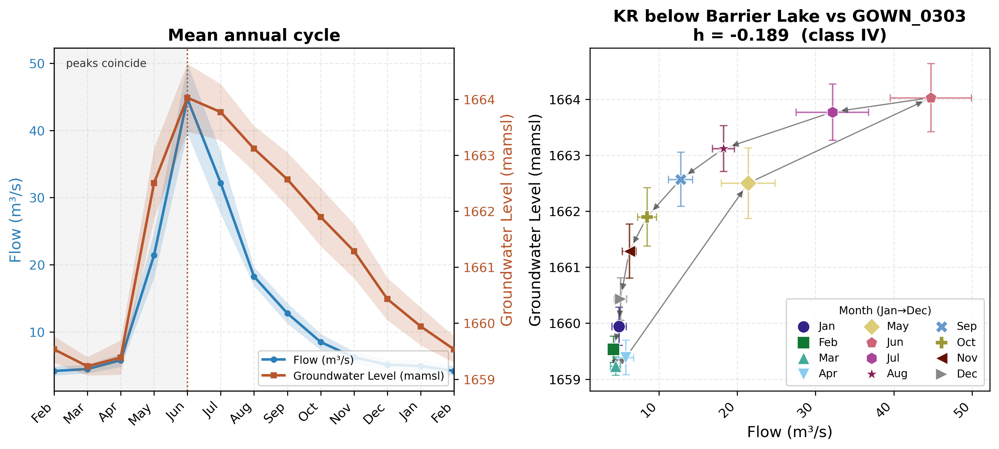

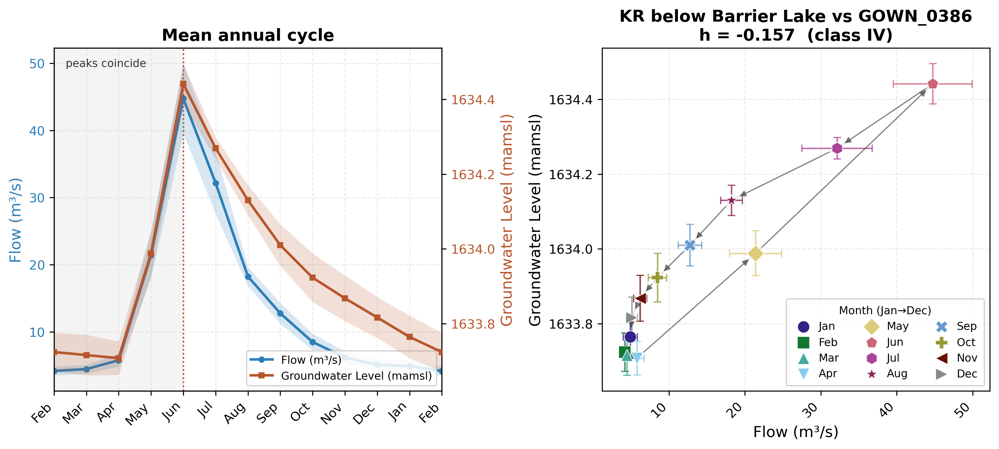

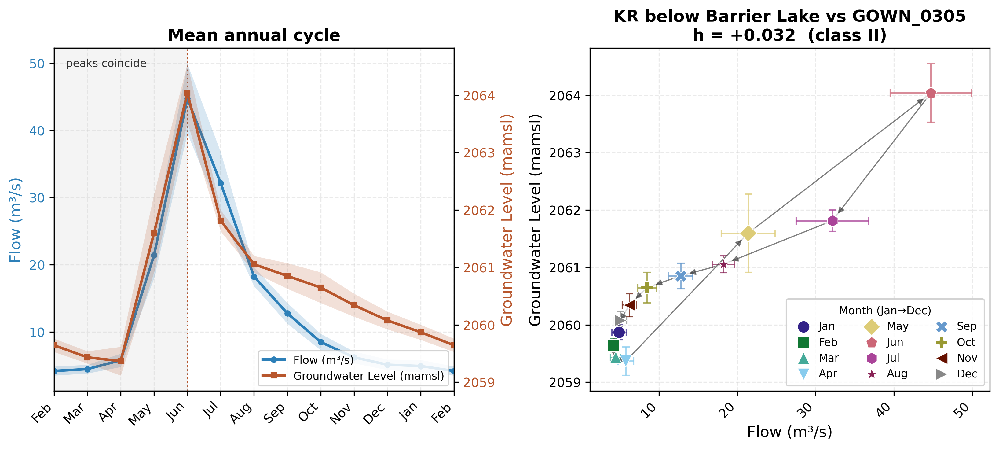

In [18]:
for well in marmot_creek_wells:
    plot_well_summary(GOWN[well], bl, f'KR below Barrier Lake vs GOWN_{well}')

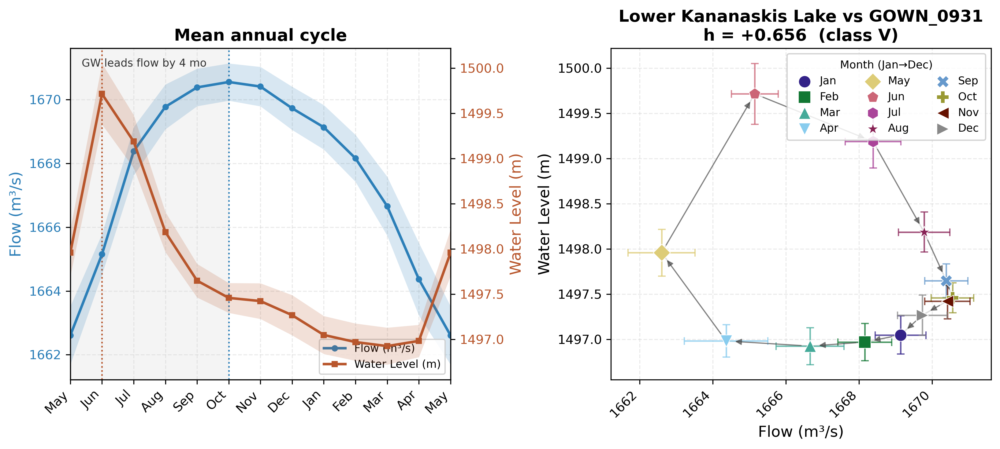

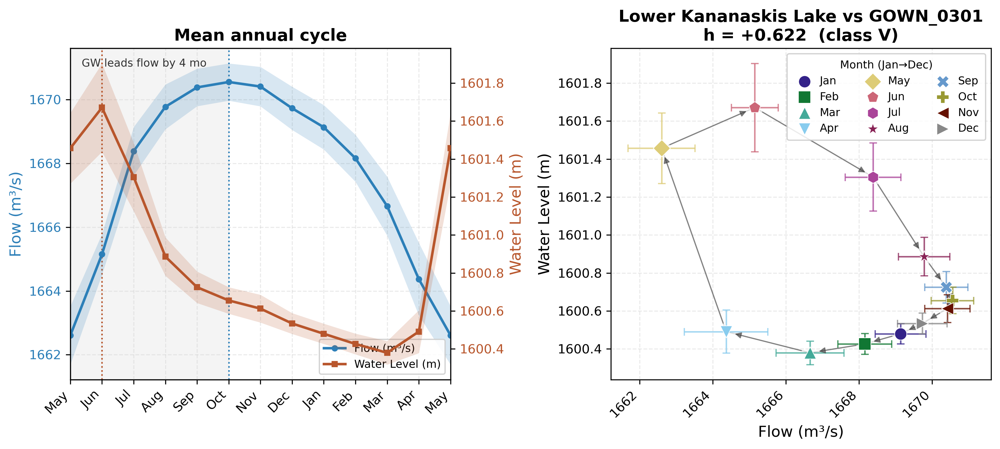

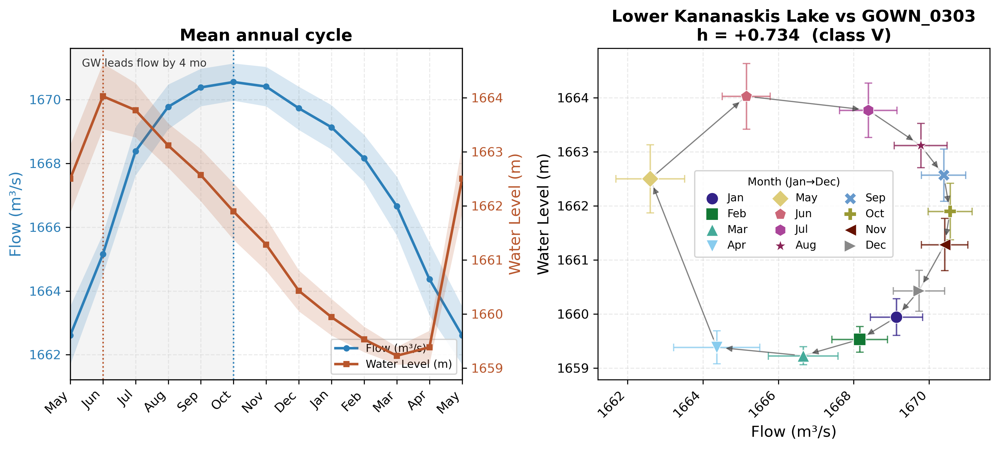

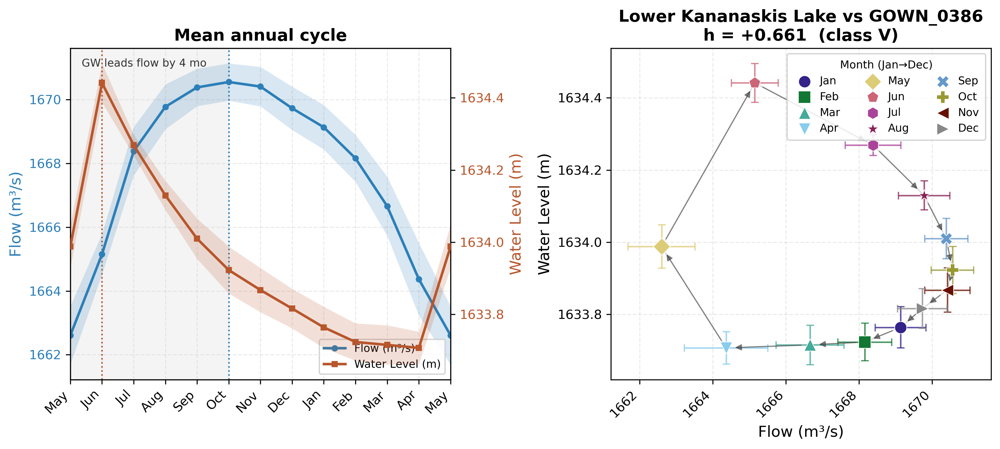

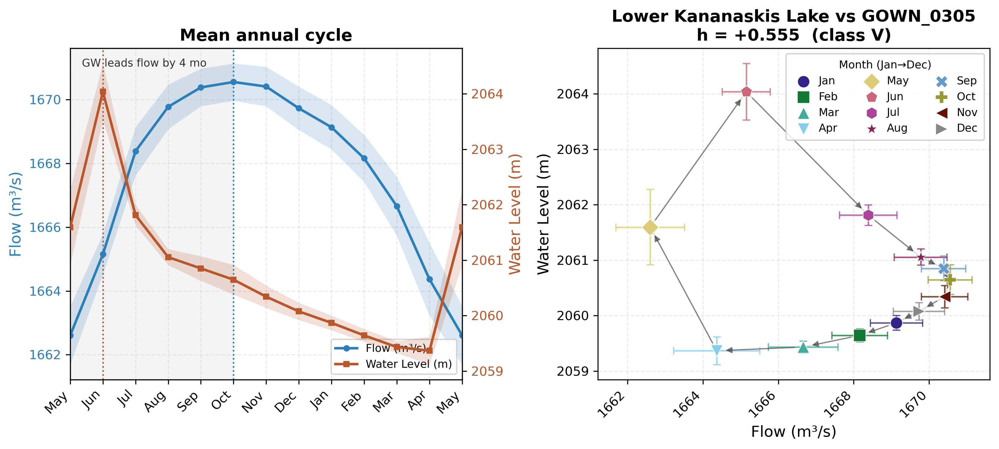

In [19]:
for well in marmot_creek_wells:
    plot_well_summary(GOWN[well], lkl, f'Lower Kananaskis Lake vs GOWN_{well}', ylab='Water Level (m)')